In [28]:
from matplotlib import pyplot as plt
import networkx as nx
import random
%matplotlib inline
import numpy as np


# Implementing Preferential Attachment, Multiple Topics, and Soft Initialization

In [53]:
class SocialDynamicsSimulation:
    '''
    Simulate social dynamics by strengthening opinions and connection weights
    based on random interactions between nodes.
    '''

    def __init__(self, network_size=50, alpha=0.03, beta=0.3, gamma=7, num_topics = 5):
        '''
        Inputs:

            network_size (int) The number of nodes in the random Watts-Strogatz
              small-world network. Default: 50.

            alpha (float) The rate at which nodes adjust their opinions to
              match neighboring nodes' opinions during interactions.
              Default: 0.03.

            beta (float) The rate at which edge weights are changed in
              response to differing opinions. Default: 0.3.

            gamma (float) The pickiness of nodes. Nodes with opinions differing
              by more than 1/gamma will result in an edge weight decreasing.
              Default: 4.
        '''
        self.network_size = network_size
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.num_topics = num_topics
    def initialize(self, hard_initialization = 0, graph = "watts_strogatz"):
        '''
        Initialize the simulation with a random graph, with random 0 or 1
        opinions assigned to all nodes and initial edge weights of 0.5.
        
        hard_initialization sets all opinions to either 0 or 1.
        If false, soft initialization sets all opinions to a sample 
        from the mixture of beta distribution
        '''
        if graph == "watts_strogatz":
            self.graph = nx.watts_strogatz_graph(self.network_size, 5, 0.5)
        elif graph == "barabasi":
            self.graph = nx.barabasi_albert_graph(self.network_size, 3)
        for edge in self.graph.edges:
            self.graph.edges[edge]['weight'] = 0.5
        for node in self.graph.nodes:
            if hard_initialization:
                correlated_topics = np.hstack((np.random.beta(2,2,self.num_topics/2), 
                           np.random.beta(2,2,self.num_topics-self.num_topics/2)))
                self.graph.nodes[node]['opinion'] = np.random.binomial(1, 
                        p=correlated_topics).astype(float)
            else:
                topics = np.random.choice([0, 1], self.num_topics)
                beliefs = []
                for topic in topics:
                    if topic == 0:
                        beliefs.append(np.random.beta(6,1))
                    else:
                        beliefs.append(np.random.beta(1,6))
                self.graph.nodes[node]['opinion'] = np.array(beliefs)
            

        self.layout = nx.spring_layout(self.graph)  # Initial visual layout
        self.step = 0

    def observe(self, animating = 0):
        '''
        Draw the state of the network.
        '''
        plt.cla()
        
            
        for topic in range(self.num_topics):
            ax = plt.subplot(self.num_topics/2+1, 2, topic+1)
            ax.set_title('Topic ' + str(topic) + ', Step: ' + str(self.step))
            self.layout = nx.spring_layout(self.graph, 
                                           pos = self.layout, iterations=5)
            
            nx.draw(
                self.graph, pos=self.layout, with_labels=True,
                node_color=[self.graph.nodes[i]['opinion'][topic] 
                            for i in self.graph.nodes],
                edge_color=[self.graph.edges[i, j]['weight'] 
                            for i, j in self.graph.edges],
                edge_cmap=plt.cm.binary, edge_vmin=0, edge_vmax=1,
                alpha=0.7, vmin=0, vmax=1)
        
        if animating == 0:
            plt.show()

    
    def update(self):
        """
        Update the state of the model by creating a new edge or 
        updating the weights and opinions or a pair of nodes after
        an interaction.
        """
        if random.uniform(0, 1) < 0.01:
            # Create a new edge with weight 0.5 or -0.5 between 2 nodes
            nodes = list(self.graph.nodes)
            #Select a node only if it is not fully connected
            non_fully_connected_nodes = [n for n in nodes 
                            if self.graph.degree(n) < self.network_size - 1]
            random_node = random.choice(non_fully_connected_nodes)
            # Select among the non-neighbors of chosen 
            # node with preferential attachment
            non_neighbors = list(self.graph.nodes - 
                                 list(self.graph.neighbors(random_node)))

            non_neighbors_degree = np.array([degree for node, degree 
                            in self.graph.degree(non_neighbors)], dtype=float)
            non_neighbors_normalized_degree = (non_neighbors_degree 
                                / np.sum(non_neighbors_degree))
            new_neighbor = np.random.choice(non_neighbors, 
                                            p = non_neighbors_normalized_degree)
            # Sample new neighbor with probability proportional to node degree   
            self.graph.add_edge(random_node, new_neighbor, weight=0.5)
        else:
            # Select a random topic:
            topic = np.random.randint(0, self.num_topics)

            # Select a random edge
            edge = random.choice(list(self.graph.edges))
            weight = self.graph.edges[edge]['weight']
            opinions = [self.graph.nodes[n]['opinion'][topic] for n in edge]
            # Update node opinions and edge weight based on 
            # conversation on a single topic
            for i in [0, 1]:
                self.graph.nodes[edge[i]]['opinion'][topic] = (
                    opinions[i] + self.alpha * weight * (opinions[1-i] - opinions[i]))
            self.graph.edges[edge]['weight'] = (
                weight +
                self.beta * weight * (1-weight) *
                (1 - self.gamma * abs(opinions[0] - opinions[1])))
            # Remove very weak connections
            if self.graph.edges[edge]['weight'] < 0.05:
                self.graph.remove_edge(*edge)
        self.step += 1
        
    def calculate_clustering(self):
        """Calculate the average clustering coefficient of the graph: wrapper 
        for networkx's average_clustering function"""
        return nx.average_clustering(self.graph)

In [34]:
def run_simulation(sim, frames = 10, steps_per_frame = 3000):
    plt.figure(figsize=(15,10))
    sim.observe()
    cluster_evo = []
    for i in range(frames):
        for j in range(steps_per_frame):
            sim.update()
            if sim.step % 50 == 0:
                cluster_evo.append([sim.step, sim.calculate_clustering()])
        plt.figure(figsize=(15,10))
        sim.observe()
    cluster_evo = np.array(cluster_evo)
    # Plot the evolution of the average clustering of the graph
    plt.plot(cluster_evo[:,0], cluster_evo[:,1])
    plt.title("Evolution of average clustering")
    plt.xlabel("Time (steps)")
    plt.ylabel("Average Clustering")

Consider a Watts-Strogatz graph with average degree 5 and preferential attachment. The model is initialized using hard initialization. 

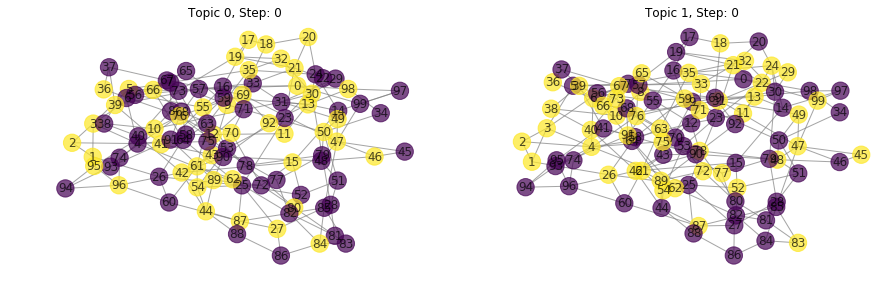

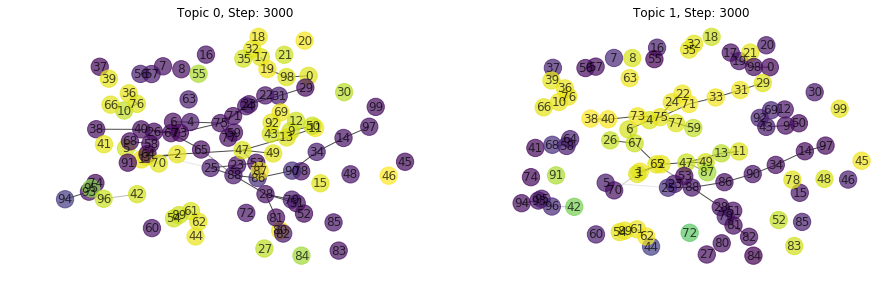

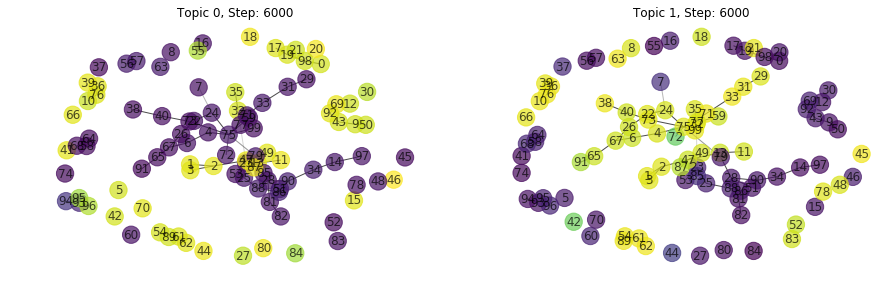

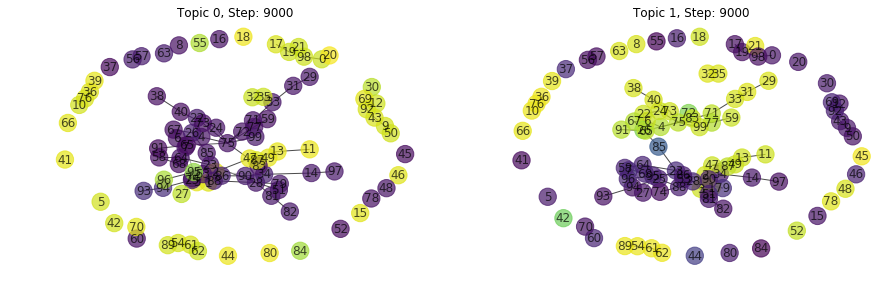

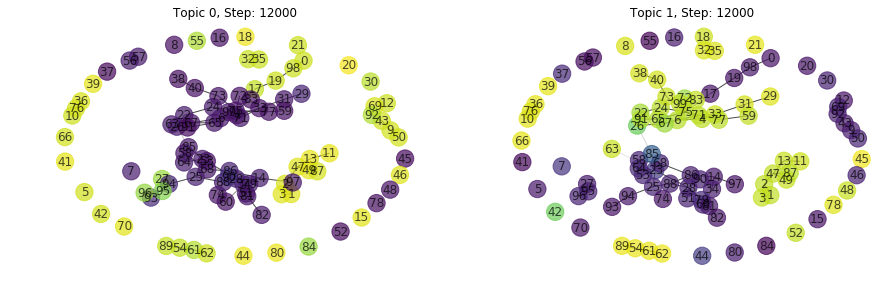

...

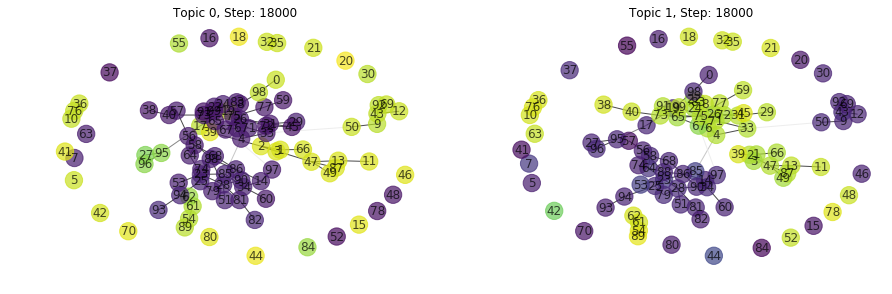

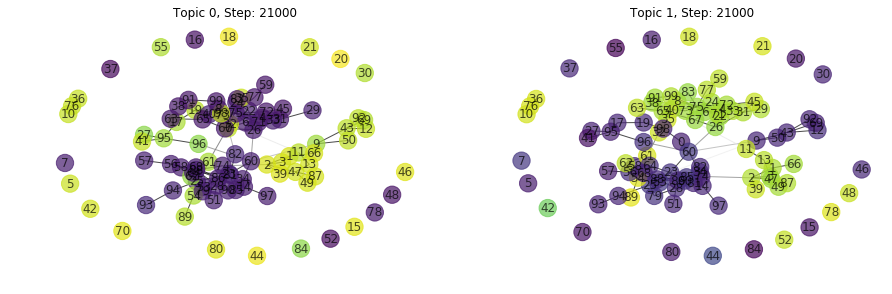

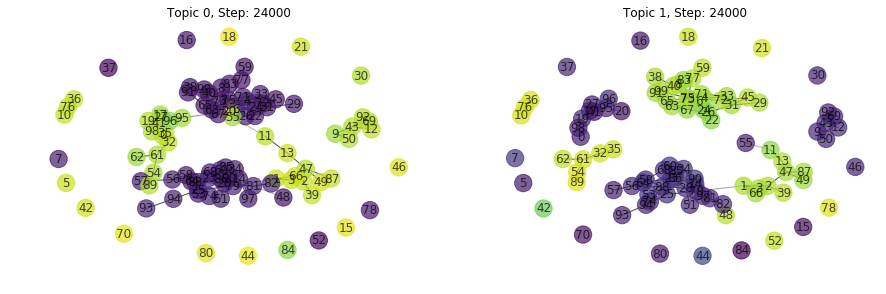

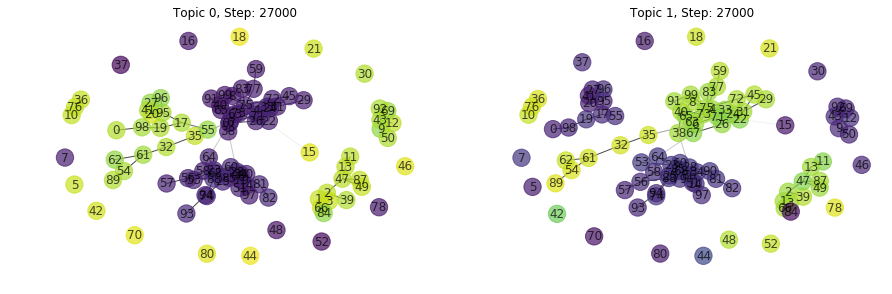

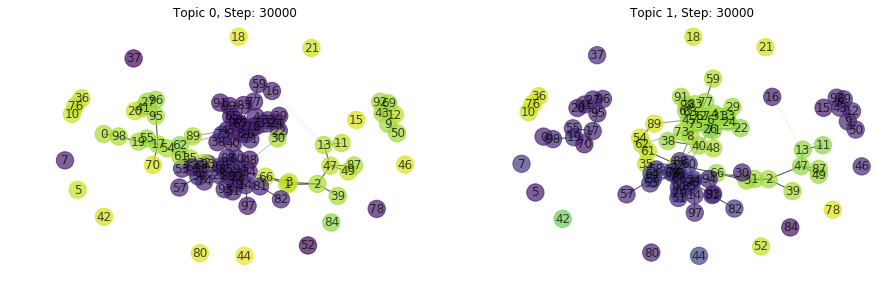

Text(0,0.5,u'Average Clustering')

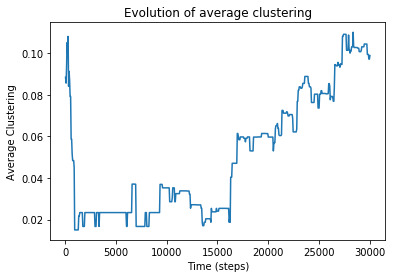

In [16]:
sim = SocialDynamicsSimulation(network_size= 100, num_topics=2, alpha=0.03, beta=0.3, gamma=5)
sim.initialize(hard_initialization = 1)
run_simulation(sim)

Consider a Watts-Strogatz graph with average degree 5 and preferential attachment. The model is initialized using soft initialization. 

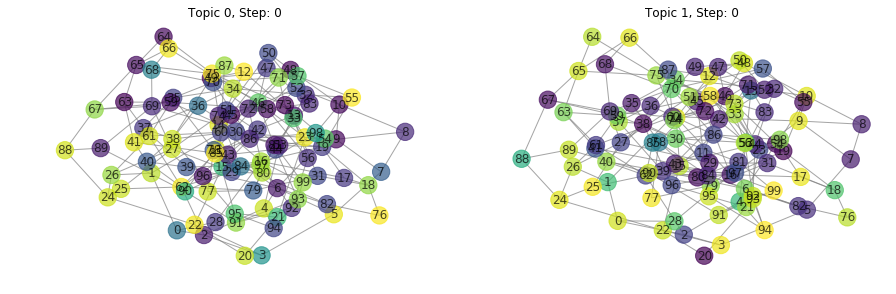

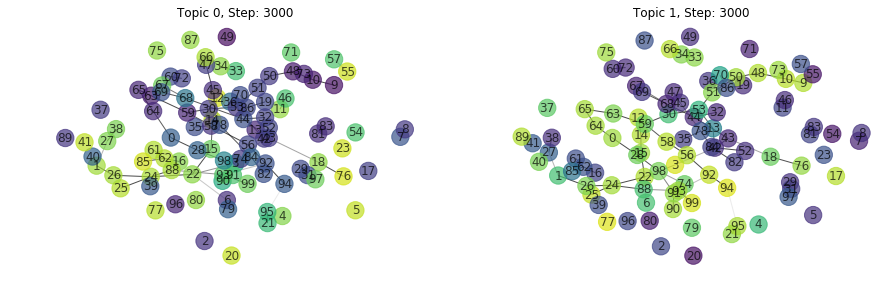

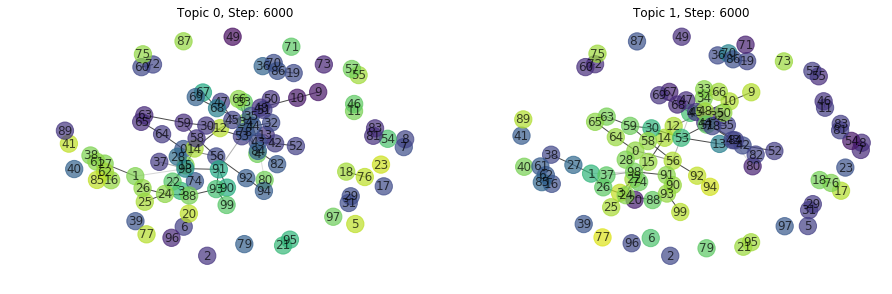

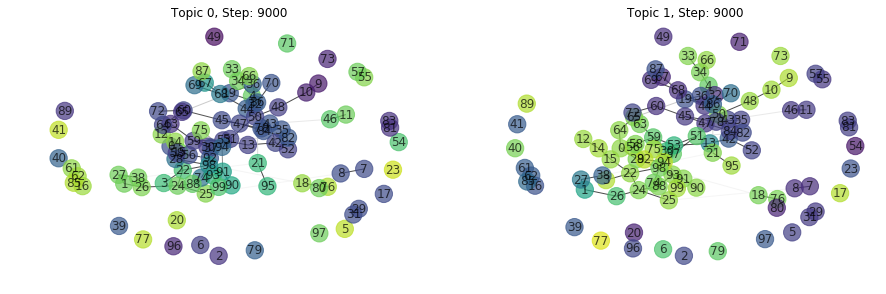

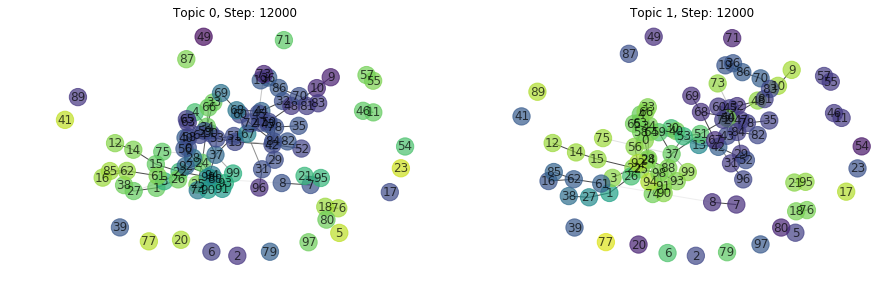

...

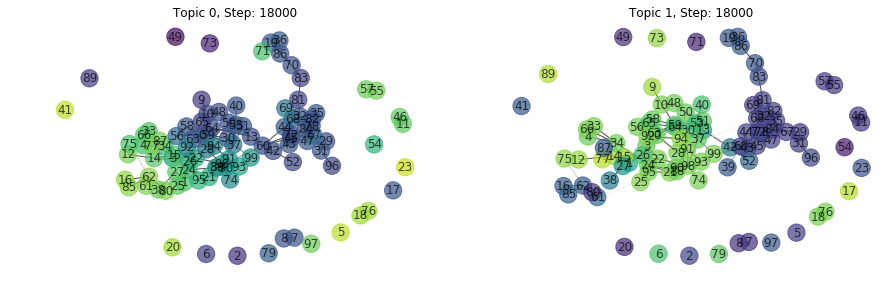

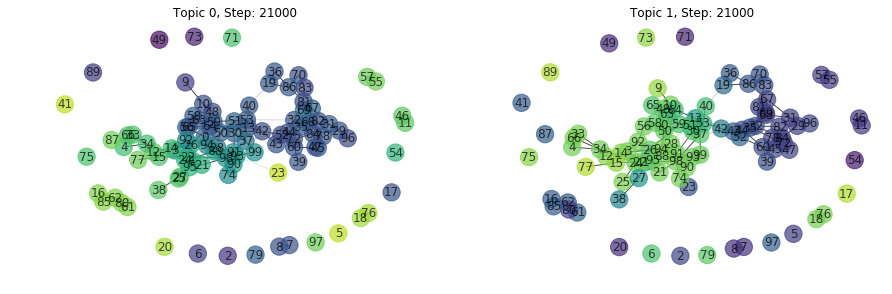

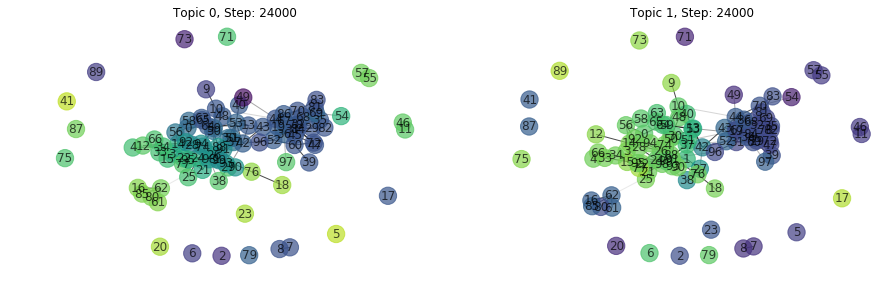

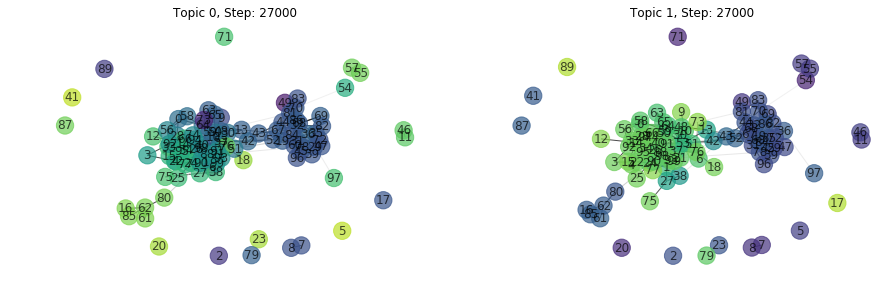

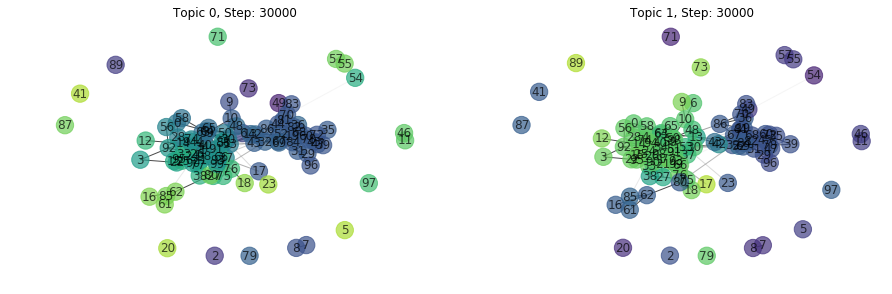

Text(0,0.5,u'Average Clustering')

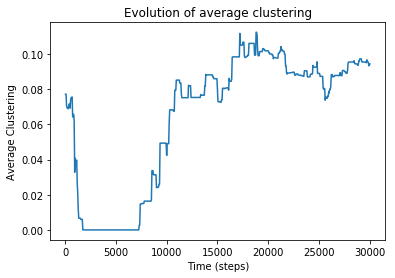

In [14]:
sim = SocialDynamicsSimulation(network_size= 100, num_topics=2, alpha=0.03, beta=0.3, gamma=5)
sim.initialize(hard_initialization = 0)
run_simulation(sim)

Consider a Barabasi-Albert graph with average degree 6 and preferential attachment. The model is initialized using hard initialization. 

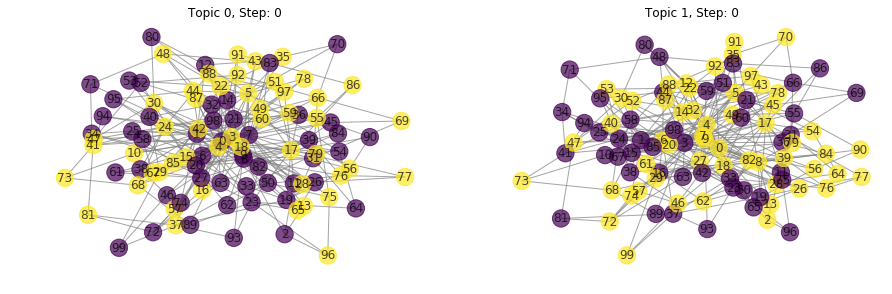

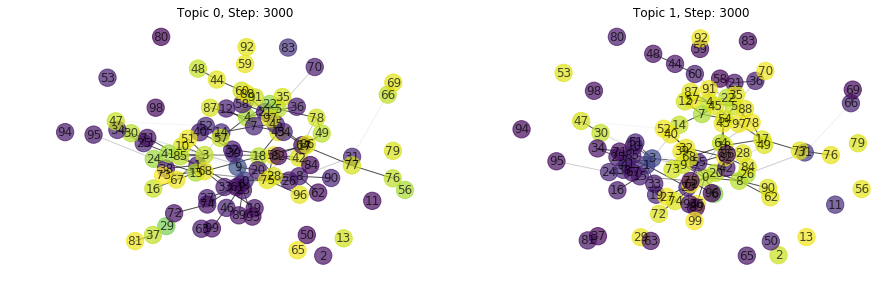

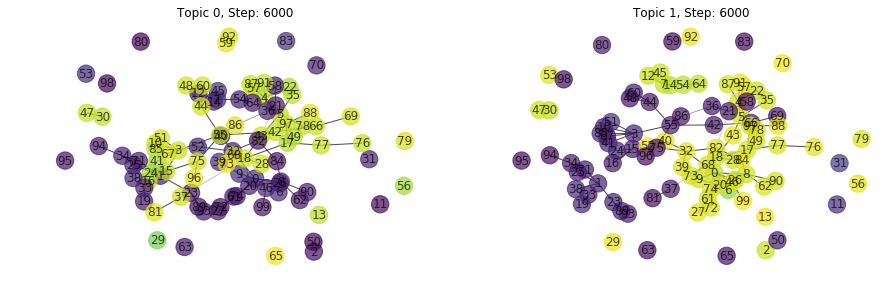

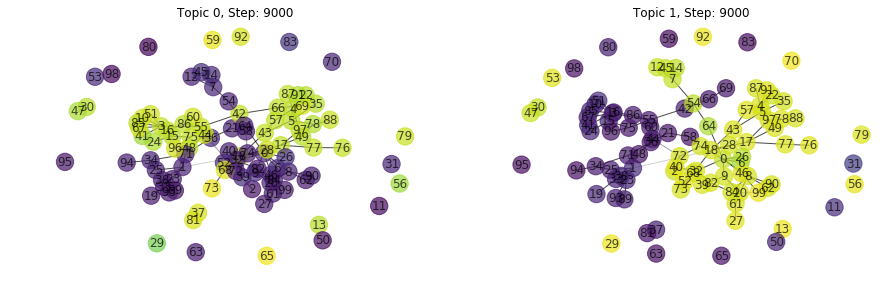

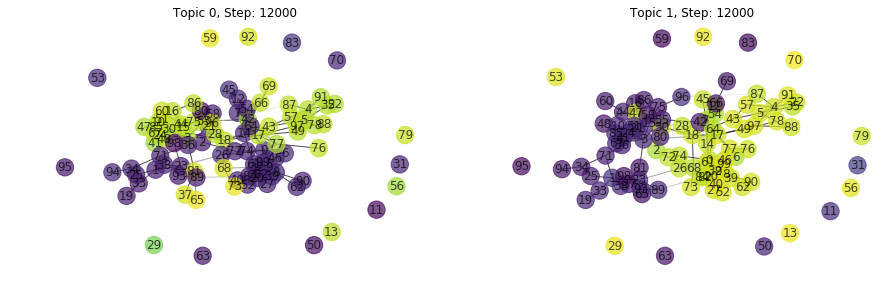

...

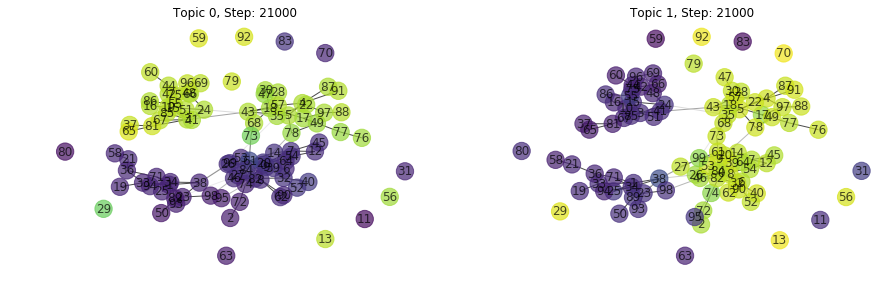

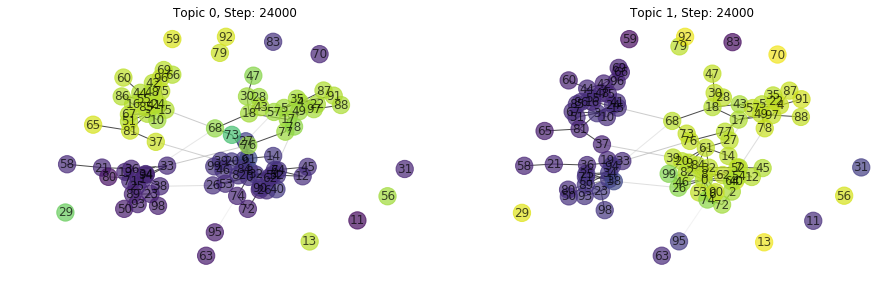

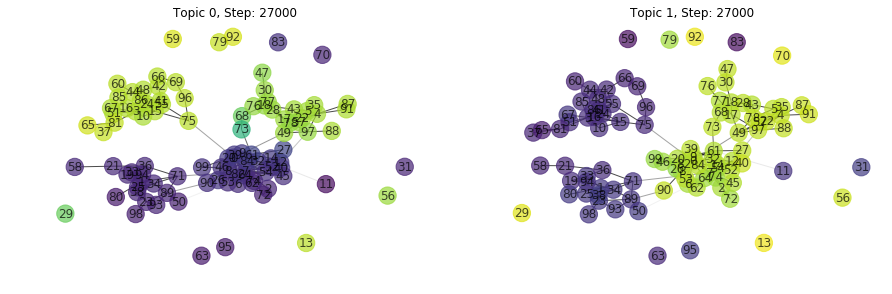

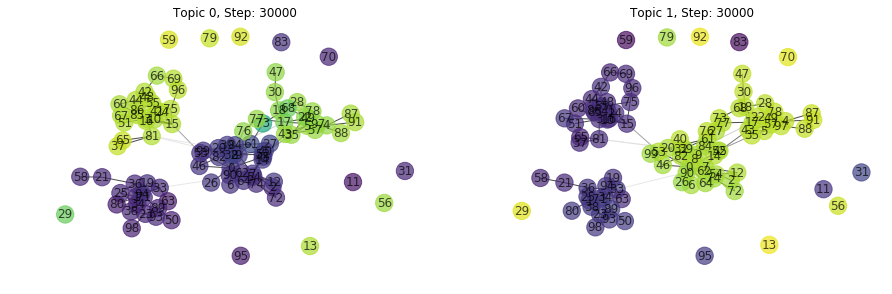

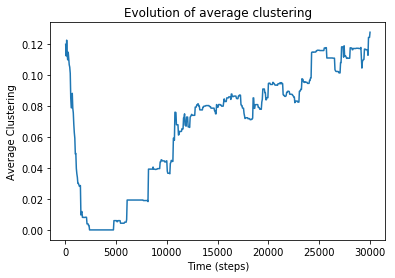

In [18]:
sim = SocialDynamicsSimulation(network_size= 100, num_topics=2, alpha=0.03, beta=0.3, gamma=5)
sim.initialize(hard_initialization = 1, graph = "barabasi")
run_simulation(sim)

Consider a Barabasi-Albert graph with average degree 6 and preferential attachment. The model is initialized using soft initialization. 

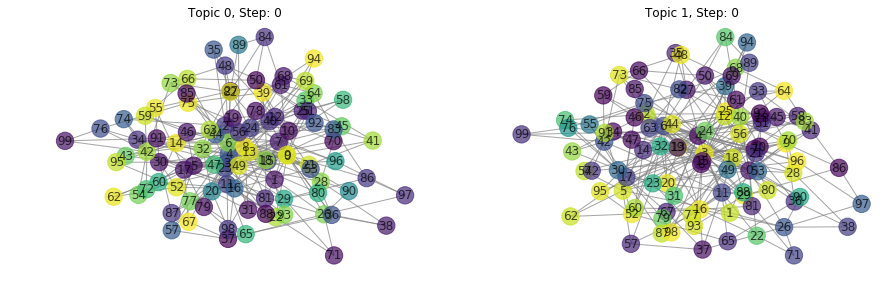

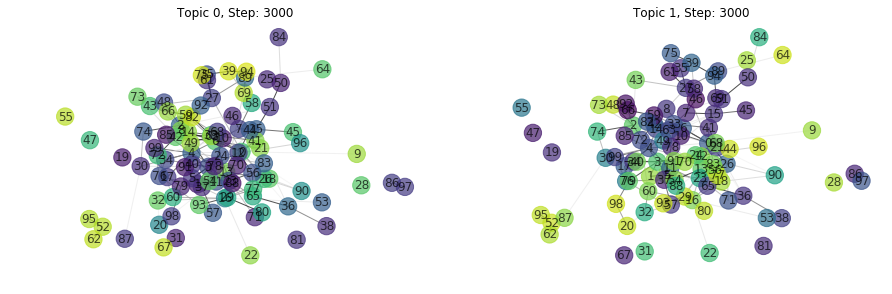

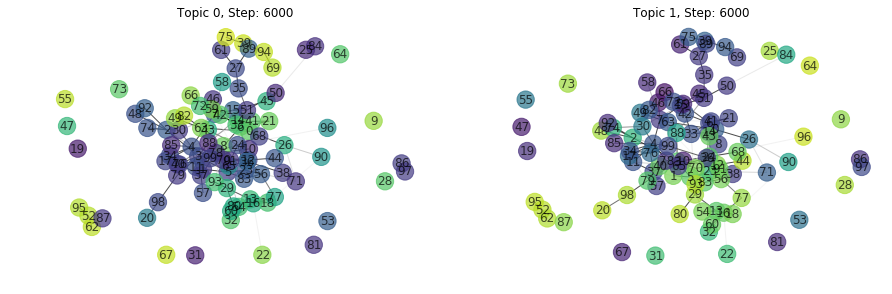

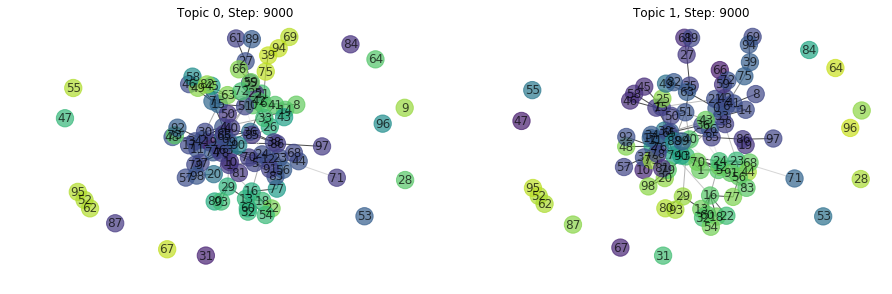

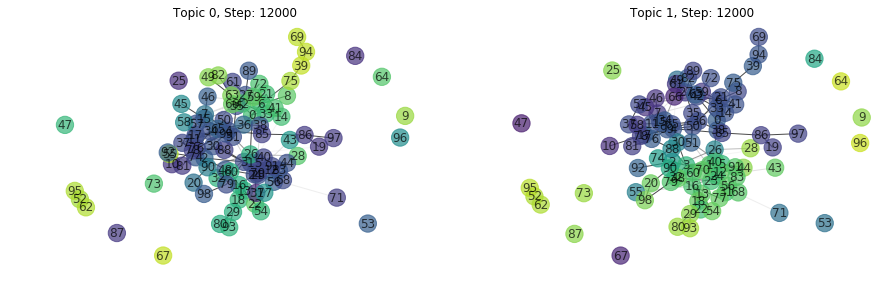

...

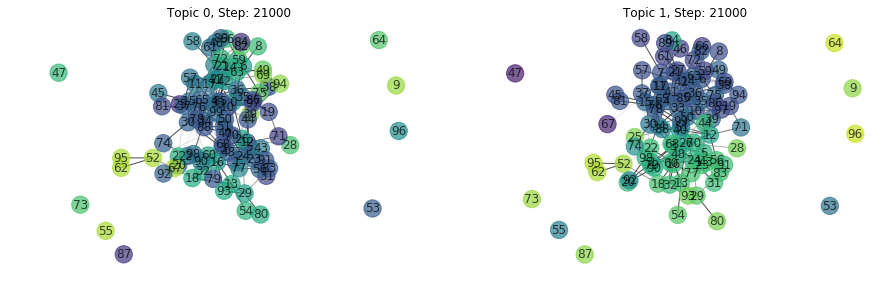

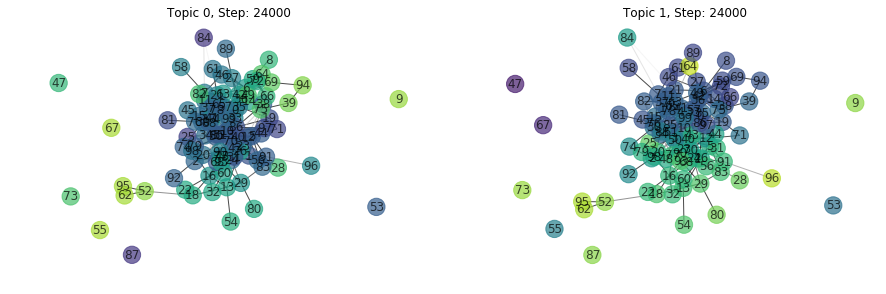

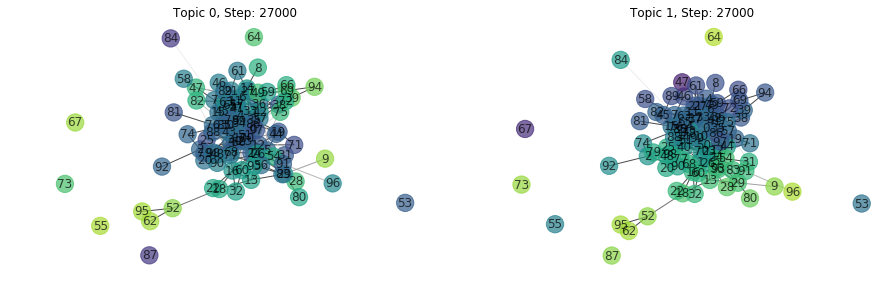

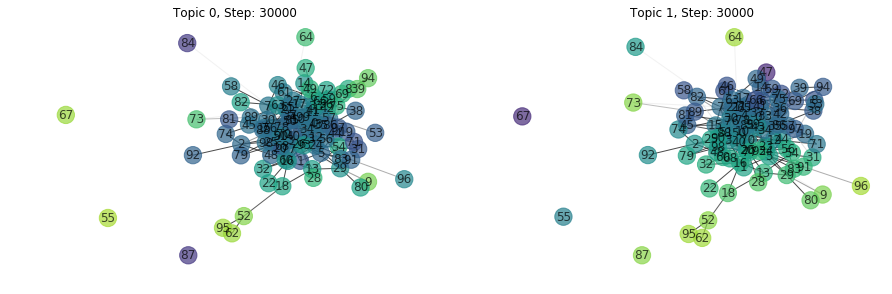

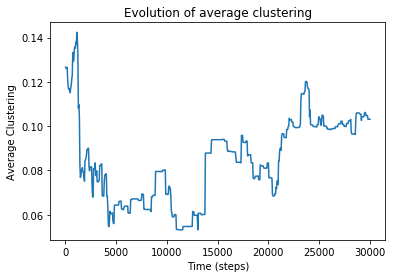

In [15]:
sim = SocialDynamicsSimulation(network_size= 100, num_topics=2, alpha=0.03, beta=0.3, gamma=5)
sim.initialize(hard_initialization = 0, graph = "barabasi")
run_simulation(sim)

# Implementing Negative Weights (Constructive and Destructive Relationships)

In [26]:
class NegativeWeightsSimulation(SocialDynamicsSimulation):
    '''
    Simulate social dynamics by strengthening opinions and connection weights
    based on random interactions between nodes.
    Extends class SocialDynamicsSimulation previously defined
    '''

    def initialize(self, hard_initialization = 0, graph = "watts_strogatz"):
        '''
        Initialize the simulation with a random graph
        opinions assigned to all nodes and initial edge weights of 0.5 or -0.5.
        
        hard_initialization sets all opinions to either 0 or 1.
        If false, soft initialization sets all opinions to a sample from the mixture of beta distribution
        '''
        if graph == "watts_strogatz":
            self.graph = nx.watts_strogatz_graph(self.network_size, 5, 0.5)
        elif graph == "barabasi":
            self.graph = nx.barabasi_albert_graph(self.network_size, 3)
        for edge in self.graph.edges:
            self.graph.edges[edge]['weight'] = np.random.choice([0.5, -0.5],p = [0.9, 0.1])
        for node in self.graph.nodes:
            if hard_initialization:
                correlated_topics = np.hstack((np.random.beta(2,2,self.num_topics/2), 
                           np.random.beta(2,2,self.num_topics-self.num_topics/2)))
                self.graph.nodes[node]['opinion'] = np.random.binomial(1, p=correlated_topics).astype(float)
            else:
                topics = np.random.choice([0, 1], self.num_topics)
                beliefs = []
                for topic in topics:
                    if topic == 0:
                        beliefs.append(np.random.beta(6,1))
                    else:
                        beliefs.append(np.random.beta(1,6))
                self.graph.nodes[node]['opinion'] = np.array(beliefs)
            

        self.layout = nx.spring_layout(self.graph)  # Initial visual layout
        self.step = 0


    def observe(self, animating = 0):
        '''
        Draw the state of the network.
        '''
        plt.cla()
        
            
        for topic in range(self.num_topics):
            ax = plt.subplot(self.num_topics/2+1, 2, topic+1)
            ax.set_title('Topic ' + str(topic) + ', Step: ' + str(self.step))
            self.layout = nx.spring_layout(self.graph, pos = self.layout, iterations=5)
            
            nx.draw(
                self.graph, pos=self.layout, with_labels=True,
                node_color=[self.graph.nodes[i]['opinion'][topic] for i in self.graph.nodes],
                edge_color=[self.graph.edges[i, j]['weight'] for i, j in self.graph.edges],
                edge_cmap=plt.cm.coolwarm, edge_vmin=-1, edge_vmax=1,
                alpha=0.7, vmin=0, vmax=1)
        
        if animating == 0:
            plt.show()

    
    def update(self):
        """
        Update the state of the model by creating a new edge or 
        updating the weights and opinions or a pair of nodes after
        an interaction.
        """
        if random.uniform(0, 1) < 0.01:
            # Create a new edge with weight 0.5 between two unconnected nodes
            nodes = list(self.graph.nodes)
            non_fully_connected_nodes = [n for n in nodes if self.graph.degree(n) < self.network_size - 1]
            random_node = random.choice(non_fully_connected_nodes)

            non_neighbors = list(self.graph.nodes - list(self.graph.neighbors(random_node)))

            non_neighbors_degree = np.array([degree for node, degree in self.graph.degree(non_neighbors)], dtype=float)
            non_neighbors_normalized_degree = non_neighbors_degree / np.sum(non_neighbors_degree)
            new_neighbor = np.random.choice(non_neighbors, p = non_neighbors_normalized_degree)
                
            self.graph.add_edge(random_node, new_neighbor, weight=np.random.choice([0.5, -0.5], p = [0.9, 0.1]))

        else:
            # Select a random topic:
            topic = np.random.randint(0, self.num_topics)
            # Select a random edge
            edge = random.choice(list(self.graph.edges))
            weight = self.graph.edges[edge]['weight']
            opinions = [self.graph.nodes[n]['opinion'][topic] for n in edge]
            # Update node opinions and edge weight based on conversation on a single topic
            for i in [0, 1]:
                self.graph.nodes[edge[i]]['opinion'][topic] = np.clip(
                    opinions[i] + self.alpha * weight * (opinions[1-i] - opinions[i]), 0, 1)
            self.graph.edges[edge]['weight'] = np.clip(
                weight +
                self.beta * weight * (1-weight) *
                (1 - self.gamma * abs(opinions[0] - opinions[1])), -1, 1)
            # Remove very weak connections
            if abs(self.graph.edges[edge]['weight']) < 0.2:
                self.graph.remove_edge(*edge)
        self.step += 1


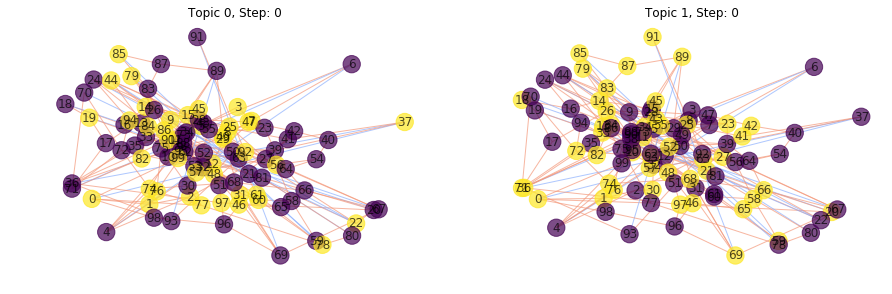

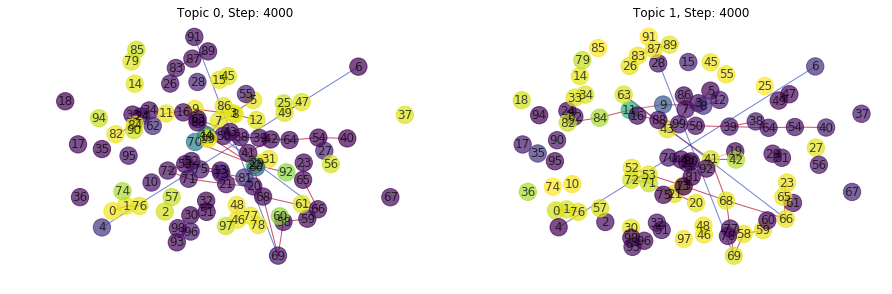

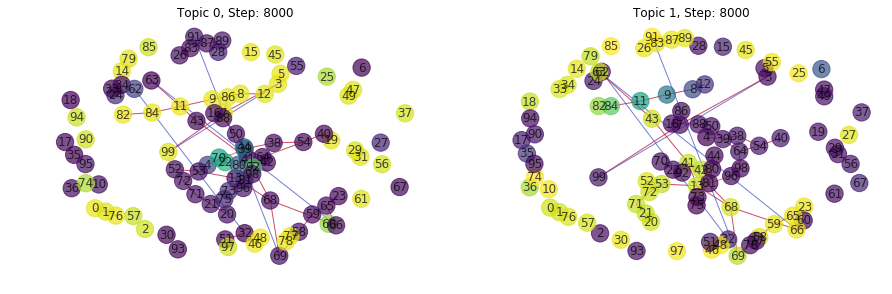

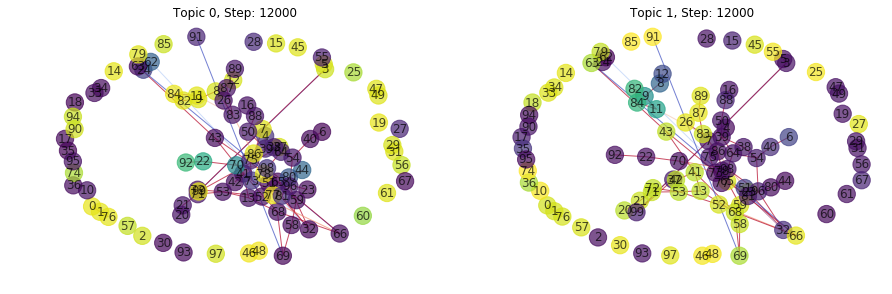

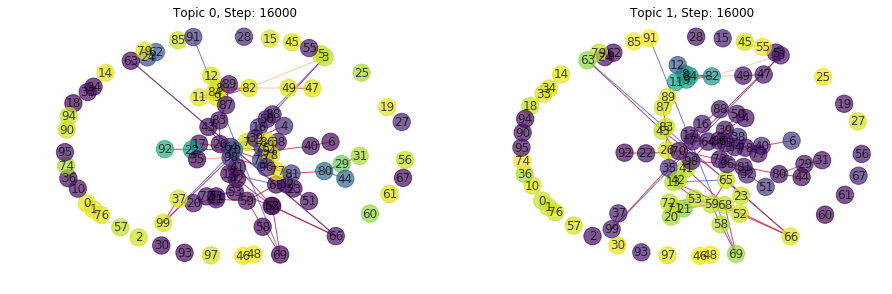

...

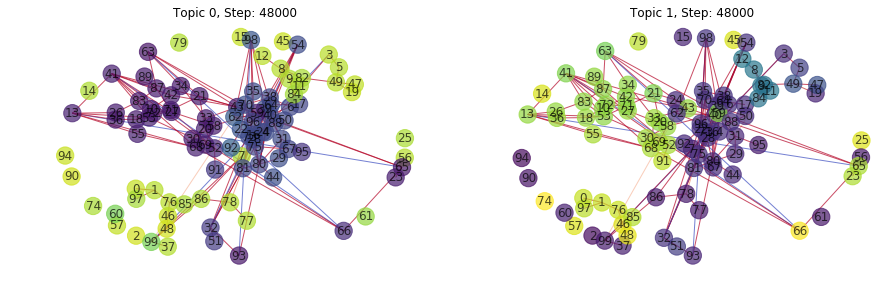

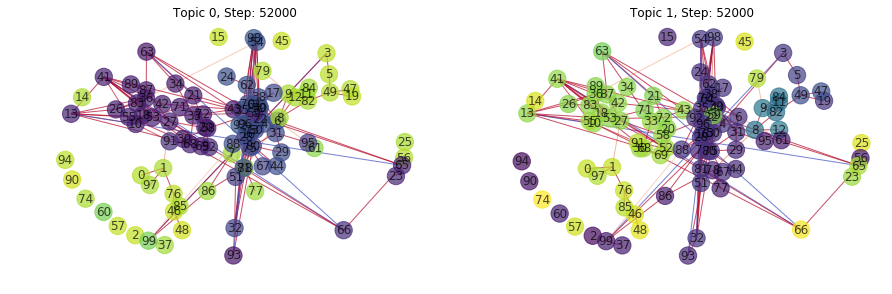

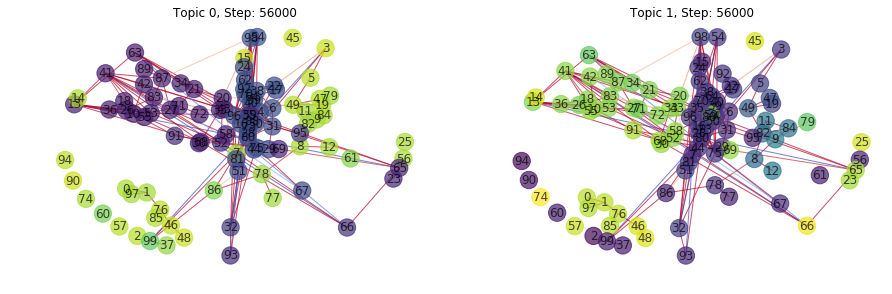

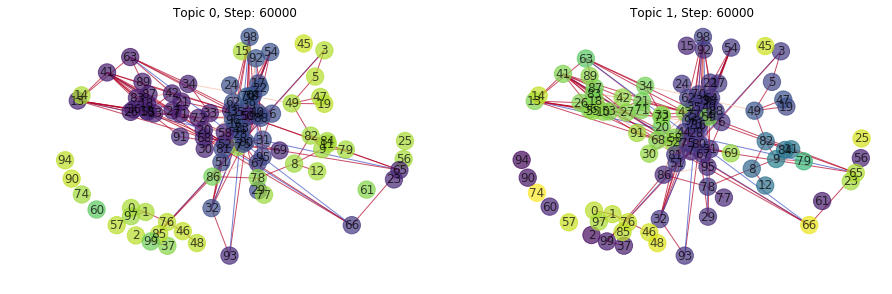

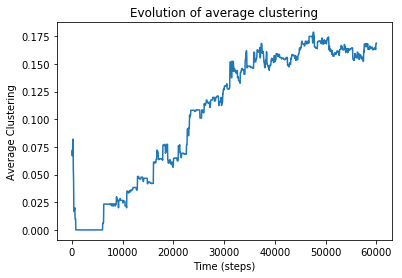

In [40]:
sim = NegativeWeightsSimulation(network_size= 100, num_topics=2, alpha=0.03, beta=0.3, gamma=5)
sim.initialize(hard_initialization = 1)
run_simulation(sim, 15, 4000)

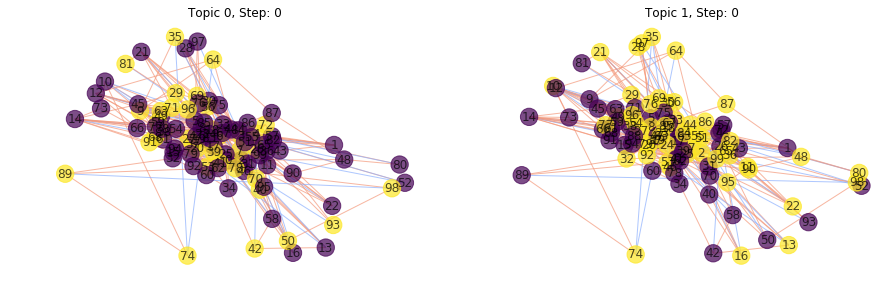

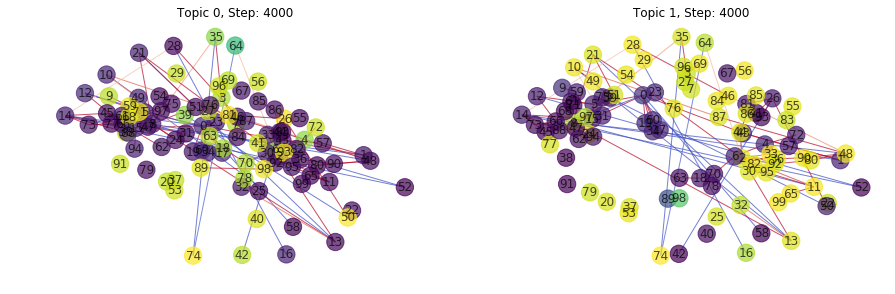

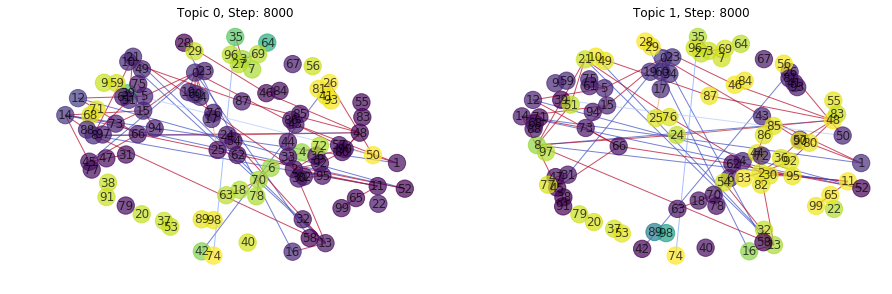

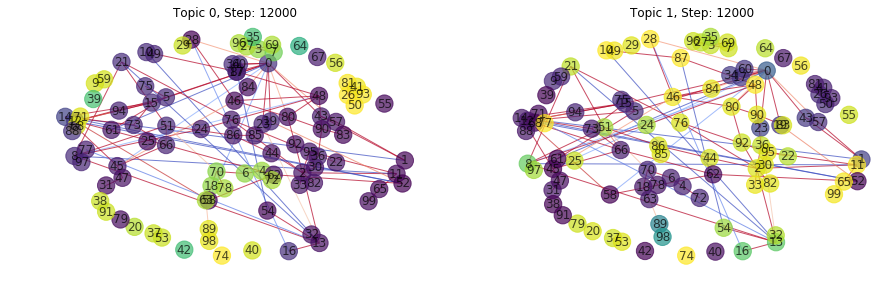

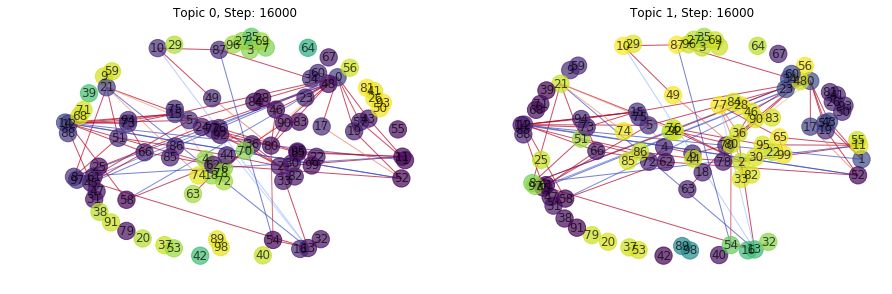

...

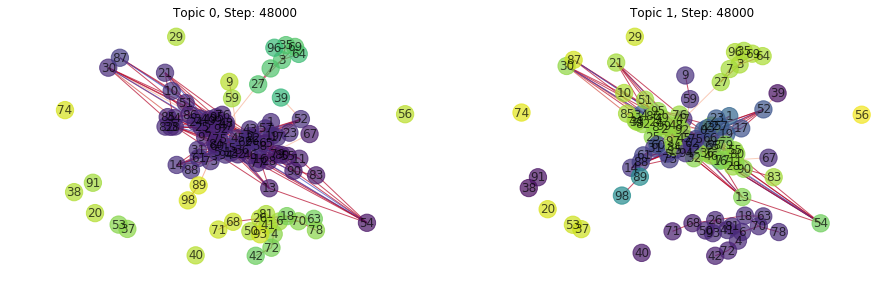

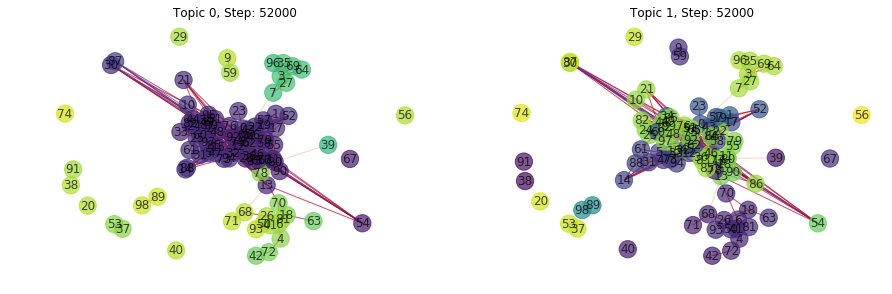

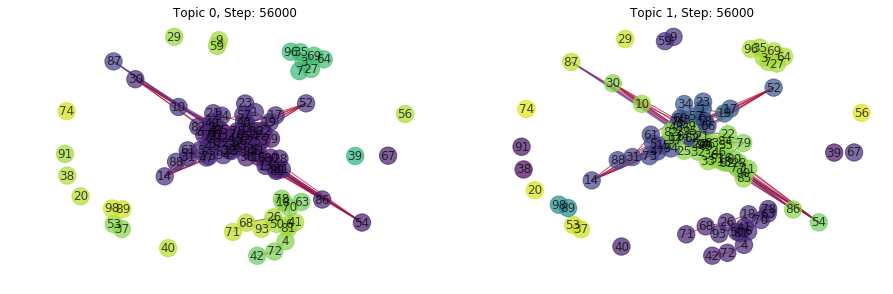

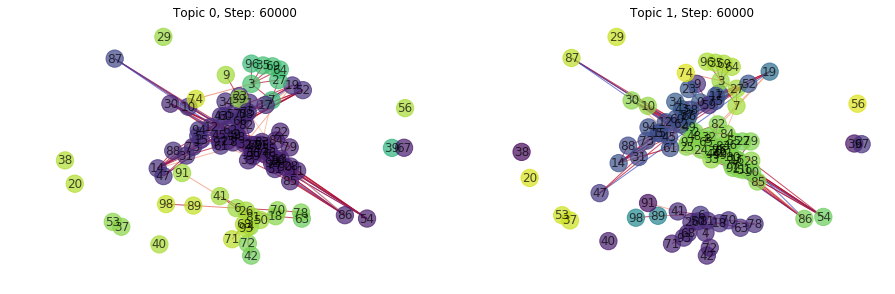

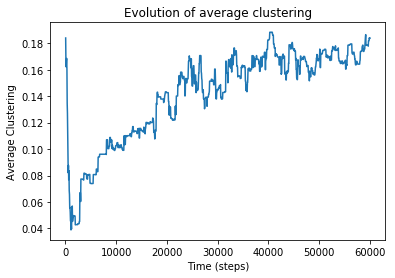

In [36]:
sim = NegativeWeightsSimulation(network_size= 100, num_topics=2, alpha=0.03, beta=0.3, gamma=5)
sim.initialize(hard_initialization = 1, graph = "barabasi")
run_simulation(sim, 15, 4000)

Note that the Barabasi-Albert graph is more realistic since real life networks tend to be scale-free (have a long tail in degree distribution). We see that network processes are accelerated in a Barabasi-Albert graph. We can see that the two communities formed have already started to converge whereas the communities in the Watts-Strogatz graph are still separated.

# Plotting Vector Fields (Adapted from Prof. Scheffler's 7.2 Code)

Plotting the vector field of the basic model for different values of parameters $\alpha, \beta, \gamma$ in order to see their effect.

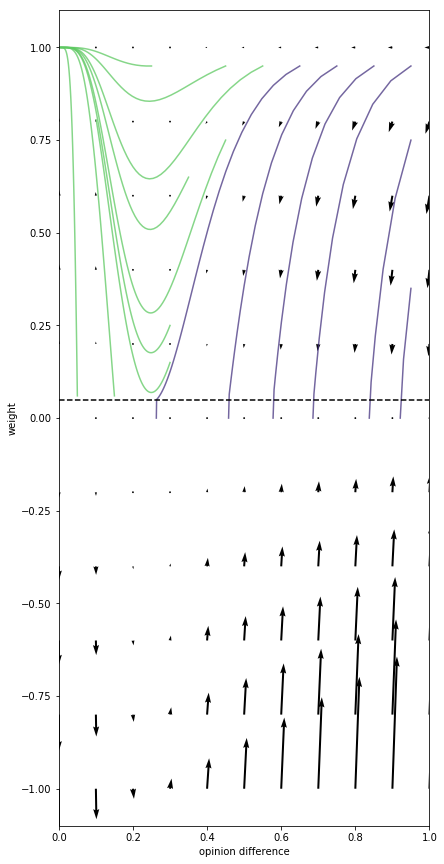

In [49]:
import matplotlib.pyplot as plt
import itertools
import scipy

alpha = 0.03
beta = 0.3

gamma = 4
plt.figure(figsize=(21,15))
cmap = plt.cm.viridis  # color map to use

# Plot traces of how opinion and weight change over time
traces = np.array([
    [0.25, 0.95], [0.45, 0.95], [0.55, 0.95], [0.65, 0.95], [0.75, 0.95],
    [0.85, 0.95], [0.95, 0.95], [0.35, 0.65], [0.45, 0.75], [0.95, 0.75],
    [0.95, 0.35], [0.3, 0.25], [0.3, 0.15], [0.15, 0.06], [0.05, 0.06]
])
new_traces = traces.copy()
new_traces[:, 1] *= -1
for opinion, weight in np.vstack((traces)):
        ow = [[opinion, 0.0, weight]]
        for i in range(100):
            delta_o = alpha * ow[-1][2] * (ow[-1][1] - ow[-1][0])
            delta_w = (
                beta * abs(ow[-1][2]) * (1-ow[-1][2]) *
                (1-gamma*abs(ow[-1][1] - ow[-1][0])))
            new_weight = ow[-1][2] + delta_w
            if new_weight < 0.05:
                new_weight = 0
            ow.append([ow[-1][0] + delta_o, ow[-1][1] - delta_o, new_weight])
        plt.plot(
            [row[0] - row[1] for row in ow],
            [row[2] for row in ow],
            color=(cmap(0.15) if ow[-1][2] == 0 else cmap(0.75)),
            alpha=0.75)


# Plot vector field

opinion = scipy.linspace(0, 1, 11)  # the difference in opinion, |o_i - o_j|
weight = scipy.linspace(-1, 1, 11)   # the edge weight, w_ij
ow_grid = scipy.meshgrid(opinion, weight)
delta_o_grid = -2*alpha * ow_grid[1] * ow_grid[0]
delta_w_grid = beta * ow_grid[1] * (1-ow_grid[1]) * (1 - gamma * ow_grid[0])
plt.quiver(ow_grid[0], ow_grid[1], delta_o_grid, delta_w_grid)

# Annotate plot
plt.xlabel('opinion difference')
plt.ylabel('weight')
plt.plot([0, 1], [0.05, 0.05], 'k--')
plt.axis('square')
plt.xlim((0,1))
plt.show()



Plotting the vector field of the domain of the weights is extended to $w_{ij} \in [-1, 1]$.

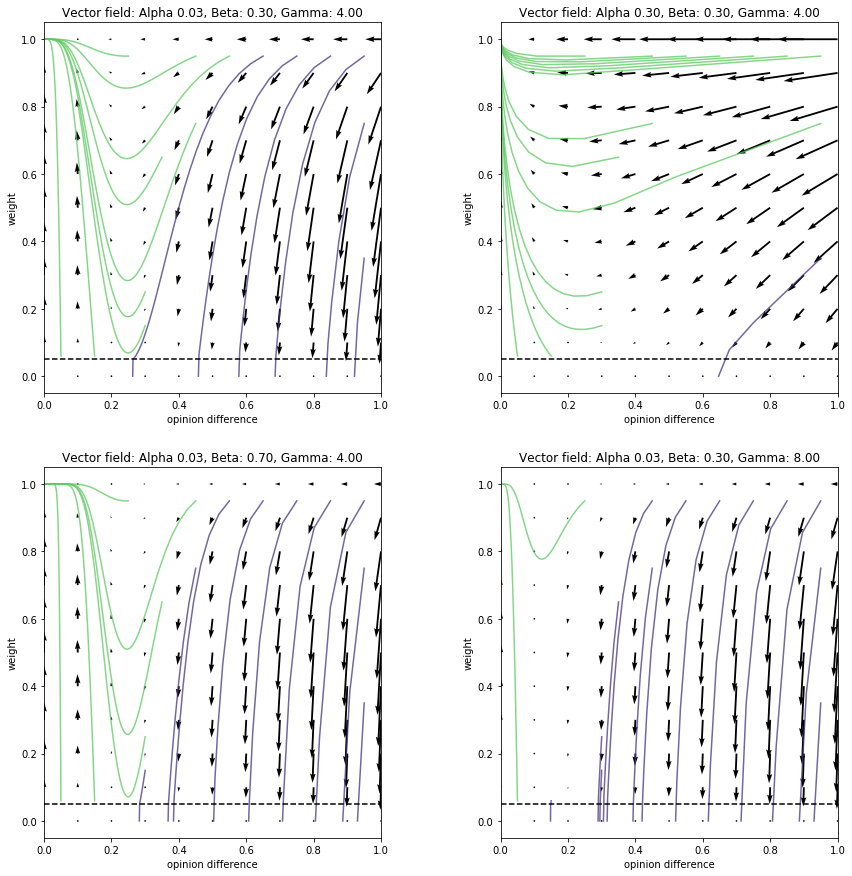

In [39]:
from matplotlib import plt
import itertools
import scipy

# alpha = 0.03
# beta = 0.3
# gamma = 4
params = [[0.03, 0.3, 4], [0.3, 0.3, 4], [0.03, 0.7, 4], [0.03, 0.3, 8]]
cmap = plt.cm.viridis  # color map to use


# Plot traces of how opinion and weight change over timehhhiv
traces = np.array([
    [0.25, 0.95], [0.45, 0.95], [0.55, 0.95], [0.65, 0.95], [0.75, 0.95],
    [0.85, 0.95], [0.95, 0.95], [0.35, 0.65], [0.45, 0.75], [0.95, 0.75],
    [0.95, 0.35], [0.3, 0.25], [0.3, 0.15], [0.15, 0.06], [0.05, 0.06]
])
new_traces = traces.copy()
new_traces[:, 1] *= -1
fig, axes = plt.subplots(2, 2, figsize = (15,15))

for index, param in enumerate(params):
    alpha, beta, gamma = param
    plt.subplot(2, 2, index + 1)
    for opinion, weight in np.vstack((traces)):
        ow = [[opinion, 0.0, weight]]
        for i in range(100):
            delta_o = alpha * ow[-1][2] * (ow[-1][1] - ow[-1][0])
            delta_w = (
                beta * abs(ow[-1][2]) * (1-ow[-1][2]) *
                (1-gamma*abs(ow[-1][1] - ow[-1][0])))
            new_weight = ow[-1][2] + delta_w
            if new_weight < 0.05:
                new_weight = 0
            ow.append([ow[-1][0] + delta_o, ow[-1][1] - delta_o, new_weight])
        plt.plot(
            [row[0] - row[1] for row in ow],
            [row[2] for row in ow],
            color=(cmap(0.15) if ow[-1][2] == 0 else cmap(0.75)),
            alpha=0.75)

    # Plot vector field
    opinion = scipy.linspace(0, 1, 11)  # the difference in opinion, |o_i - o_j|
    weight = scipy.linspace(0, 1, 11)   # the edge weight, w_ij
    ow_grid = scipy.meshgrid(opinion, weight)
    delta_o_grid = -2*alpha * ow_grid[1] * ow_grid[0]
    delta_w_grid = beta * ow_grid[1] * (1-ow_grid[1]) * (1 - gamma * ow_grid[0])
    plt.quiver(ow_grid[0], ow_grid[1], delta_o_grid, delta_w_grid)

    # Annotate plot
    plt.xlabel('opinion difference')
    plt.ylabel('weight')
    plt.plot([0, 1], [0.05, 0.05], 'k--')
    plt.axis('square')
    plt.xlim(0, 1)
    plt.title("Vector field: Alpha %.2f, Beta: %.2f, Gamma: %.2f" %(alpha, beta, gamma))
    
plt.savefig("vector_plot1.png")

